**Install detectron 2**

In [1]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'
# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 3.4 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
torch:  2.4 ; cuda:  cu121
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-xieoplc7
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-xieoplc7
  Resolved https://github.com/facebookresearch/detectron2.git to commit 8d85329aed8506ea3672e3e208971345973ea761
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━

Import necessary libraries

In [9]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

Import dataset using API

In [2]:
!curl -L "https://universe.roboflow.com/ds/S4mO1Z89il?key=zb5FyfkD4t" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   893  100   893    0     0   3018      0 --:--:-- --:--:-- --:--:--  3027
100 53.9M  100 53.9M    0     0  33.9M      0  0:00:01  0:00:01 --:--:-- 49.5M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/Chair--269-_jpg.rf.87aa2b7101b1fd216cd9762a0283f4ad.jpg  
 extracting: test/Chair--270-_jpg.rf.77fe75ee33dd358303bd3406412ff8dd.jpg  
 extracting: test/Chairs--1-_jpg.rf.7104107727daae1f8c000a66cf0dd7b1.jpg  
 extracting: test/Chairs--10-_jpg.rf.cb94c97083903d1228907f324283816a.jpg  
 extracting: test/Chairs--11-_jpg.rf.731df0193231d047877e2b6e7b1cae30.jpg  
 extracting: test/Chairs--15-_jpg.rf.9be74e388453b5ecc3adb2b5a8fd5986.jpg  
 extracting: test/Chairs--16-_jpg.rf.ddca24c24866d8fe5ce85ff1693d476d.jpg  
 extracting: test/Chairs--17-_jpg.r

Register Dataset

In [10]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [10/16 04:43:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/16 04:43:17 d2.data.datasets.coco]: Loaded 454 images in COCO format from /content/train/_annotations.coco.json


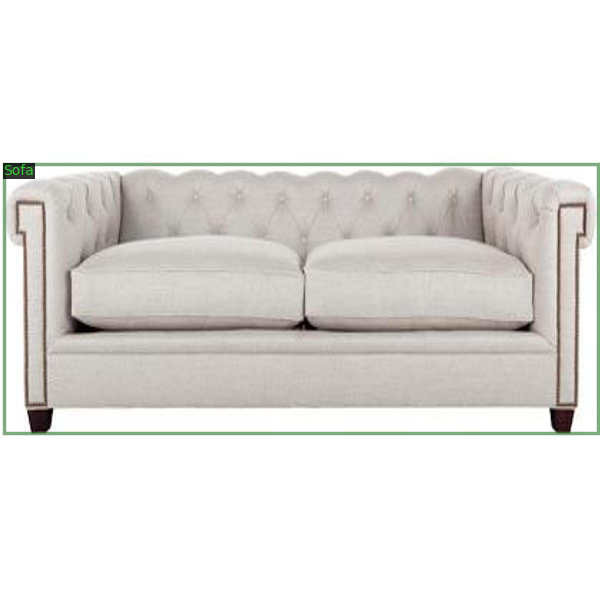

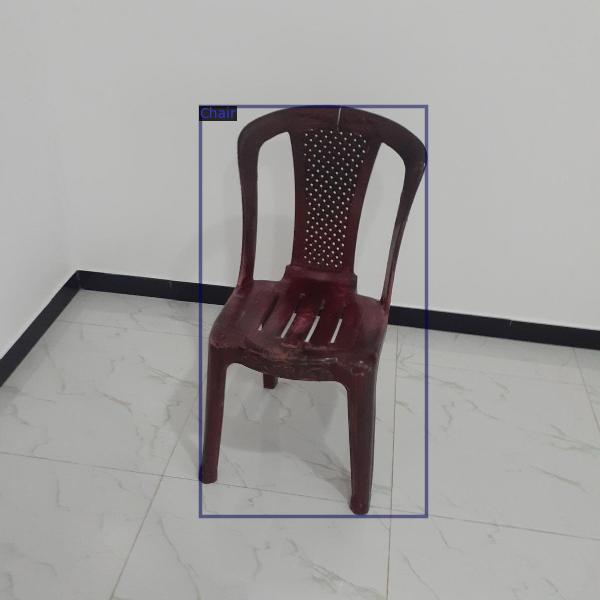

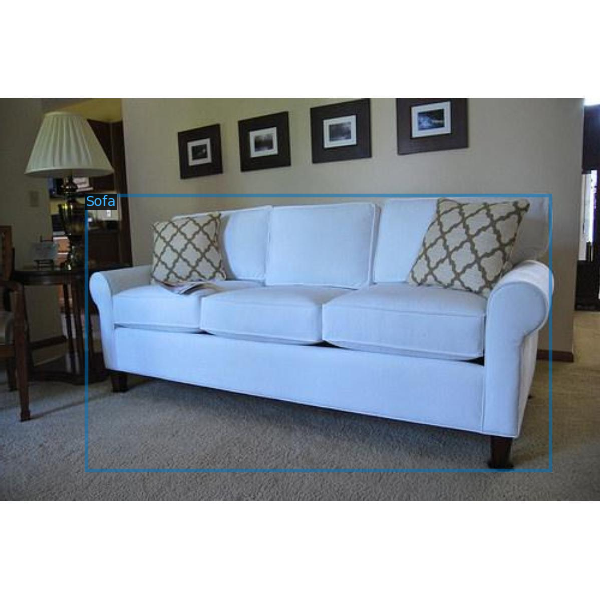

In [11]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

Model Faster R-CNN

In [12]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025  # pick a good LR
cfg.SOLVER.MAX_ITER = 500   # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6  # (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[10/16 04:43:26 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:01, 110MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[10/16 04:43:28 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[10/16 04:43:40 d2.utils.events]:  eta: 0:02:33  iter: 19  total_loss: 2.506  loss_cls: 1.839  loss_box_reg: 0.6422  loss_rpn_cls: 0.001147  loss_rpn_loc: 0.004263    time: 0.3191  last_time: 0.3123  data_time: 0.0344  last_data_time: 0.0138   lr: 9.7405e-05  max_mem: 1735M
[10/16 04:43:52 d2.utils.events]:  eta: 0:02:29  iter: 39  total_loss: 1.247  loss_cls: 0.5559  loss_box_reg: 0.6424  loss_rpn_cls: 0.000755  loss_rpn_loc: 0.002289    time: 0.3516  last_time: 0.3253  data_time: 0.0182  last_data_time: 0.0132   lr: 0.00019731  max_mem: 1735M
[10/16 04:43:58 d2.utils.events]:  eta: 0:02:21  iter: 59  total_loss: 0.9029  loss_cls: 0.3525  loss_box_reg: 0.5406  loss_rpn_cls: 0.0007121  loss_rpn_loc: 0.003107    time: 0.3364  last_time: 0.3656  data_time: 0.0110  last_data_time: 0.0125   lr: 0.0002972  max_mem: 1735M
[10/16 04:44:05 d2.utils.events]:  eta: 0:02:16  iter: 79  total_loss: 0.7963  loss_cls: 0.2414  loss_box_reg: 0.5477  loss_rpn_cls: 0.0006659  loss_rpn_loc: 0.002713    ti

In [13]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [14]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("my_dataset_test", )
predictor = DefaultPredictor(cfg)


[10/16 04:59:38 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

In [15]:
test_metadata = MetadataCatalog.get("my_dataset_test")

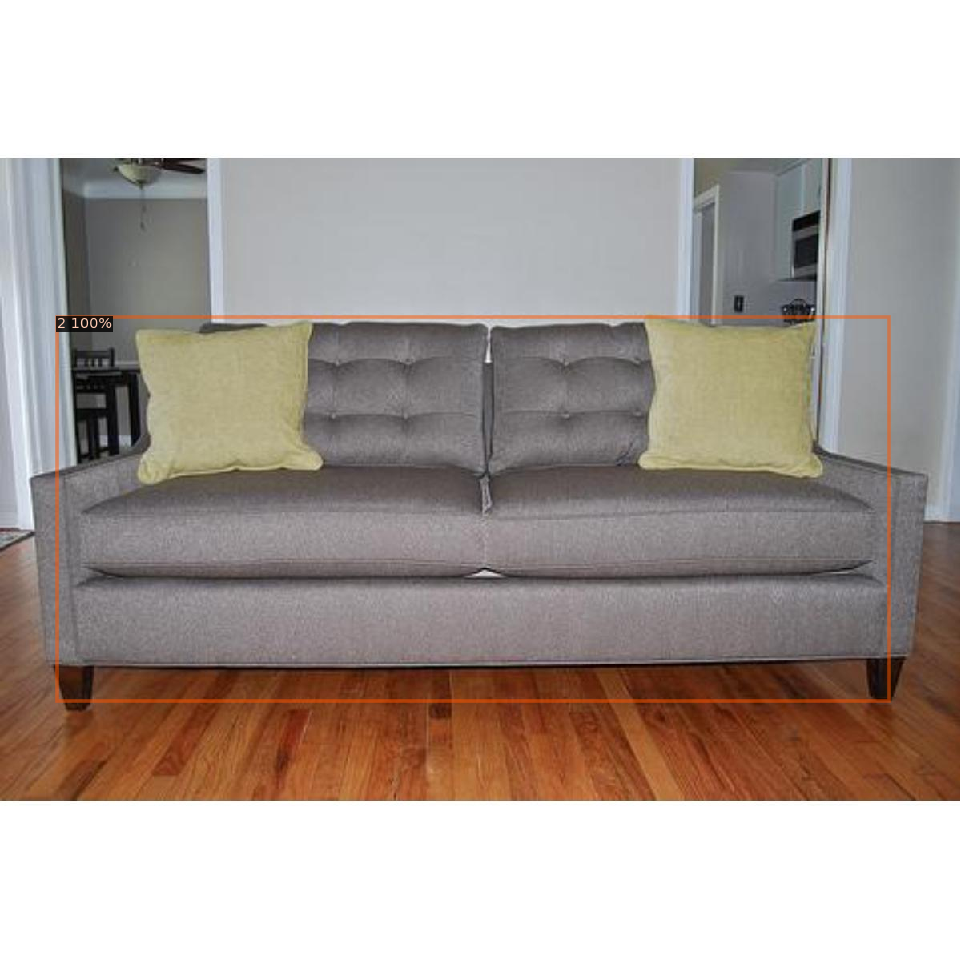

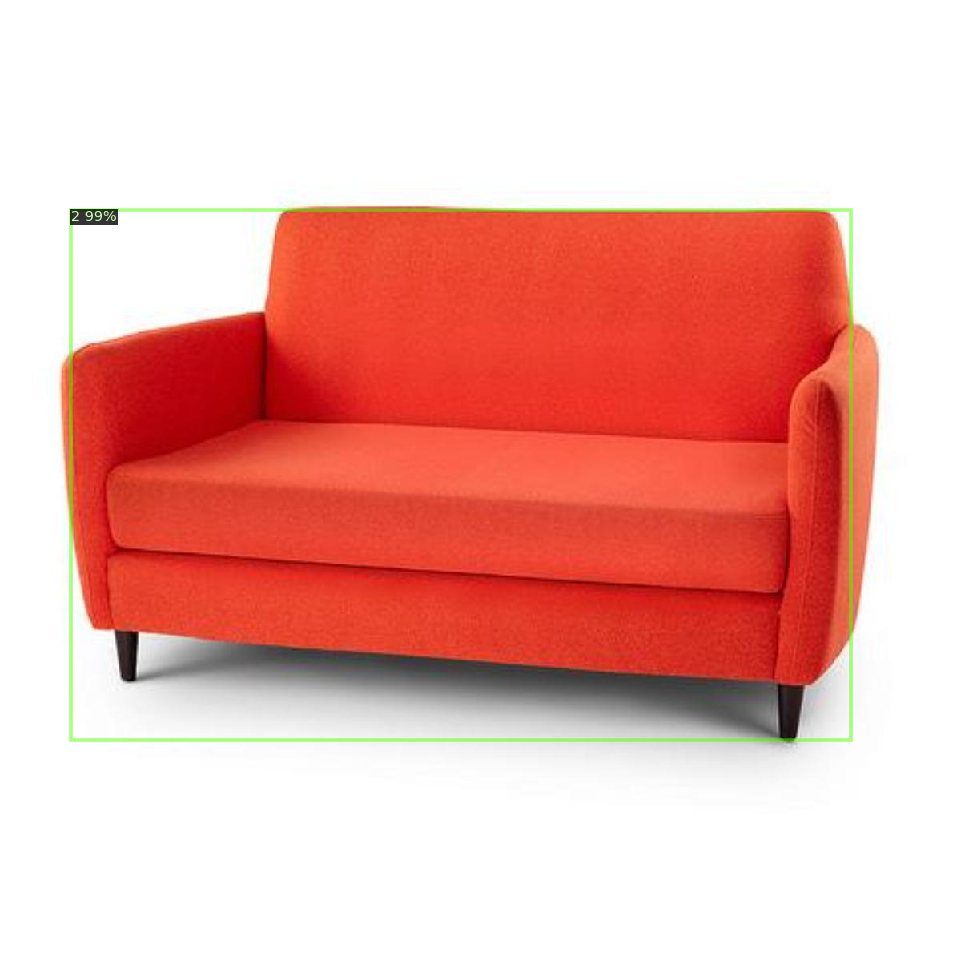

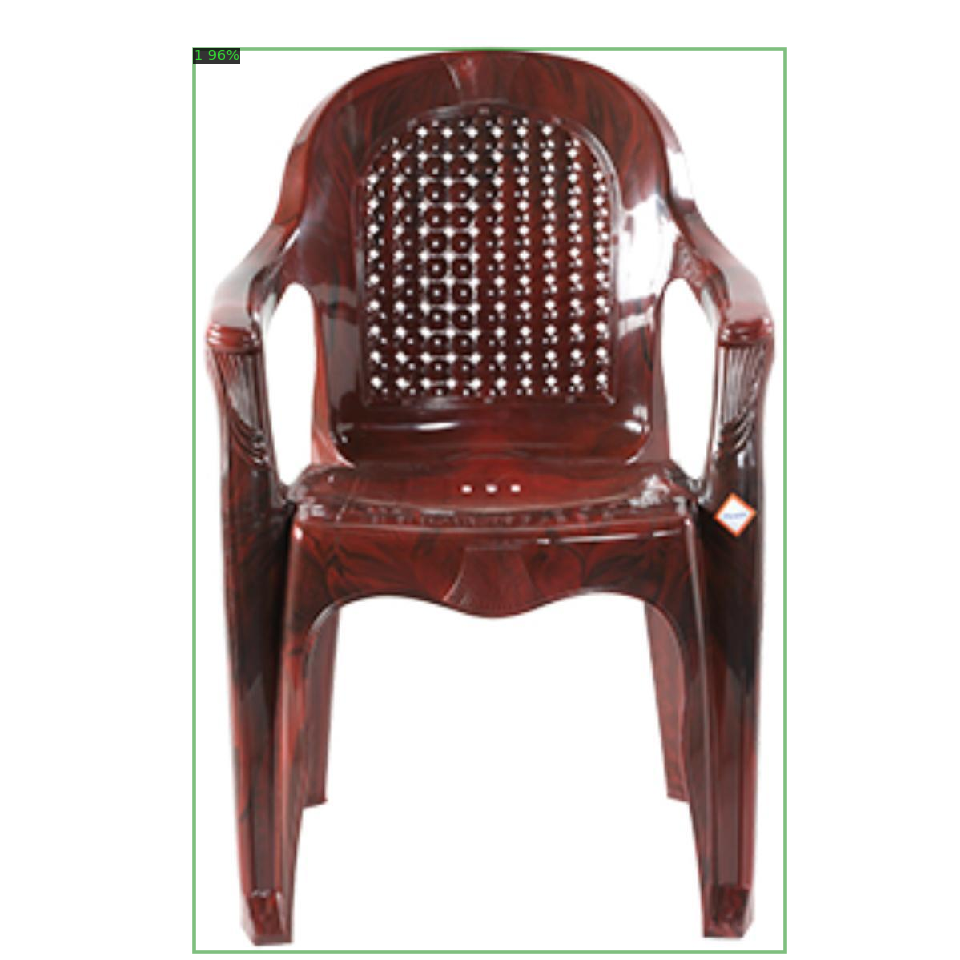

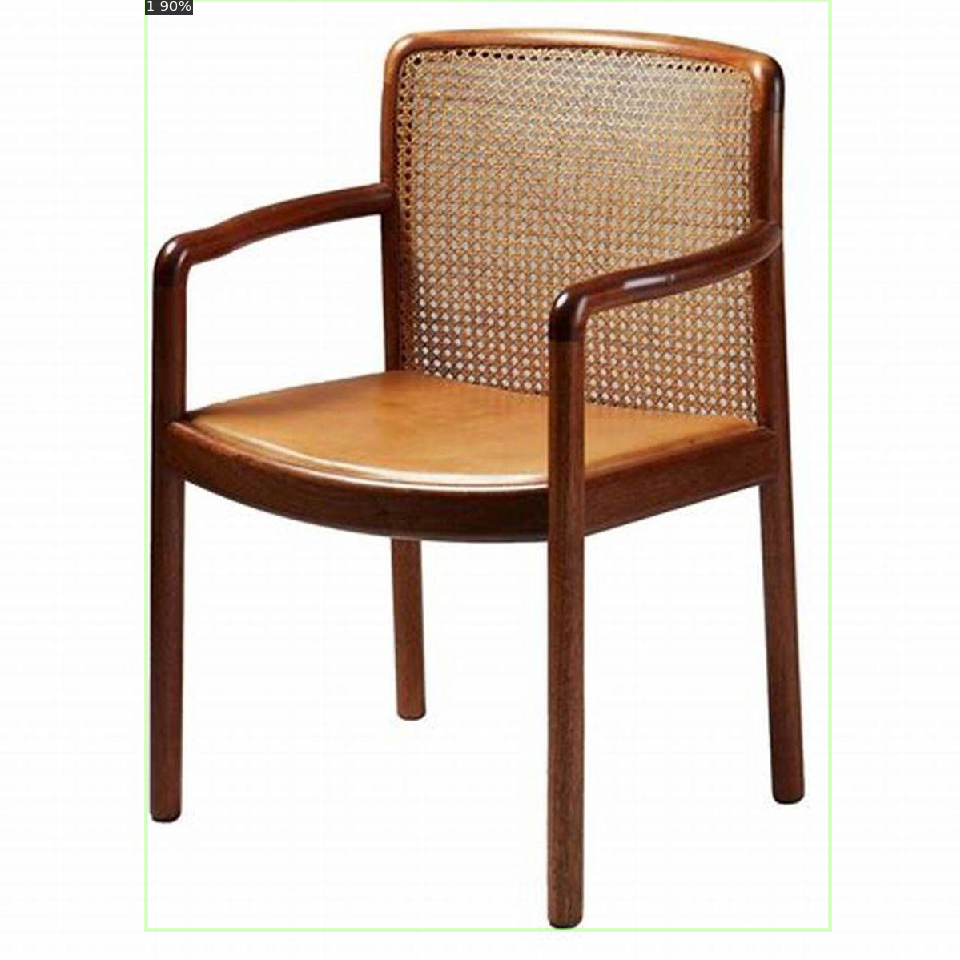

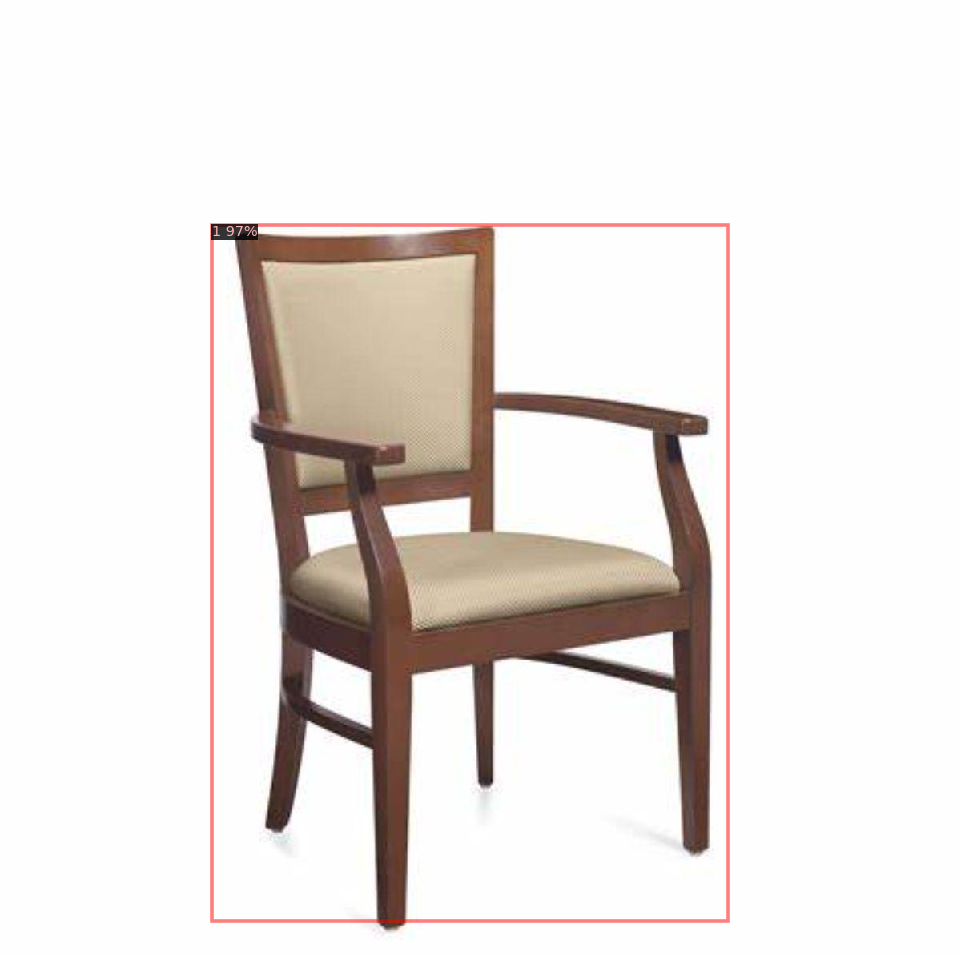

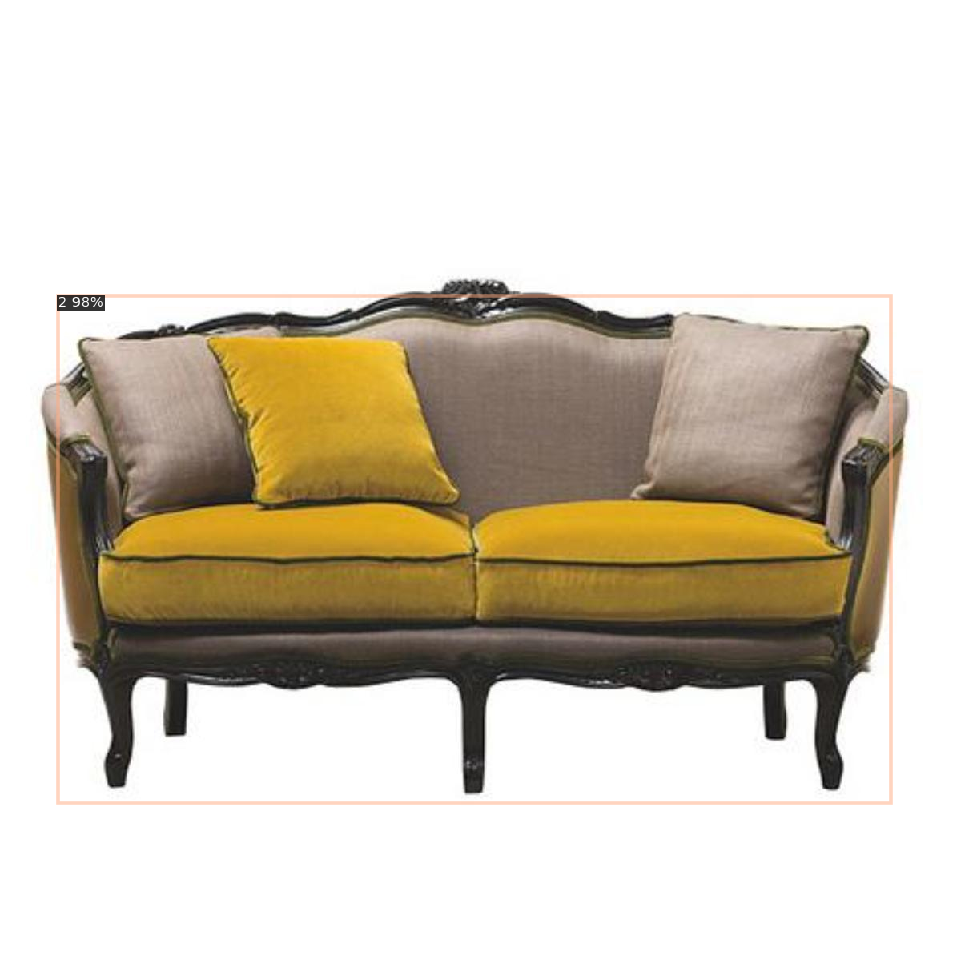

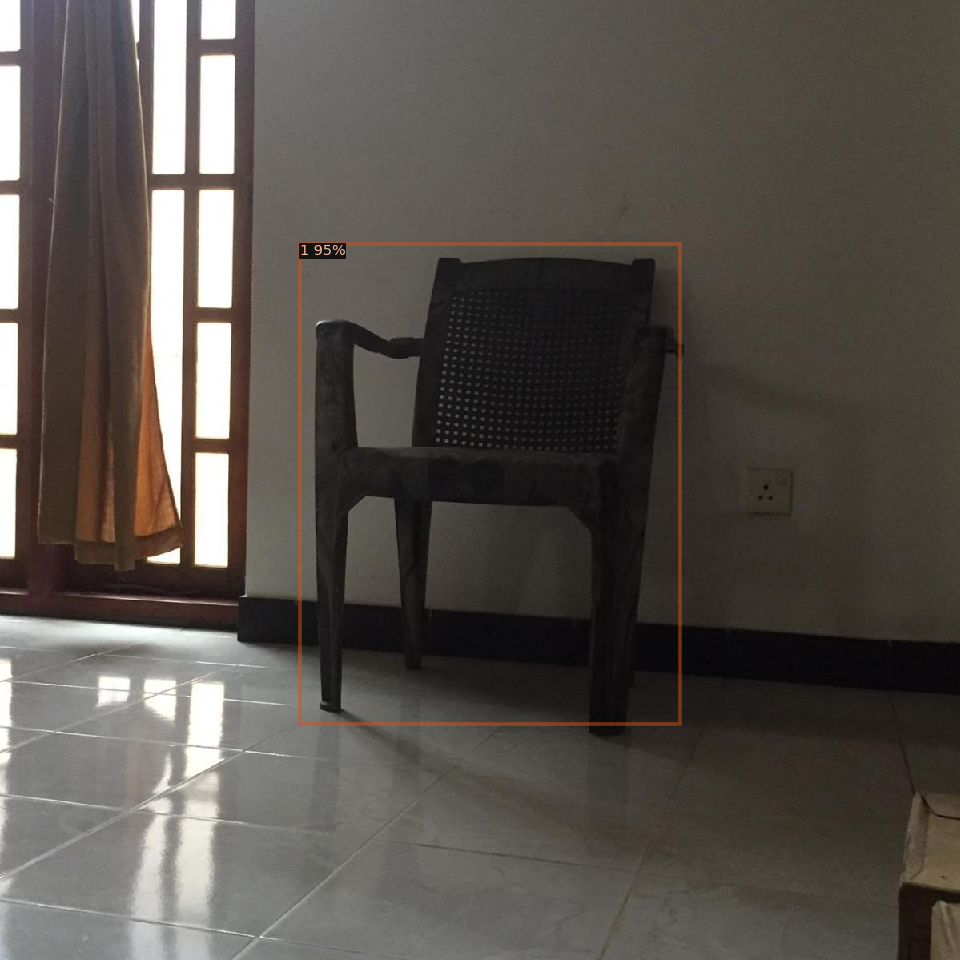

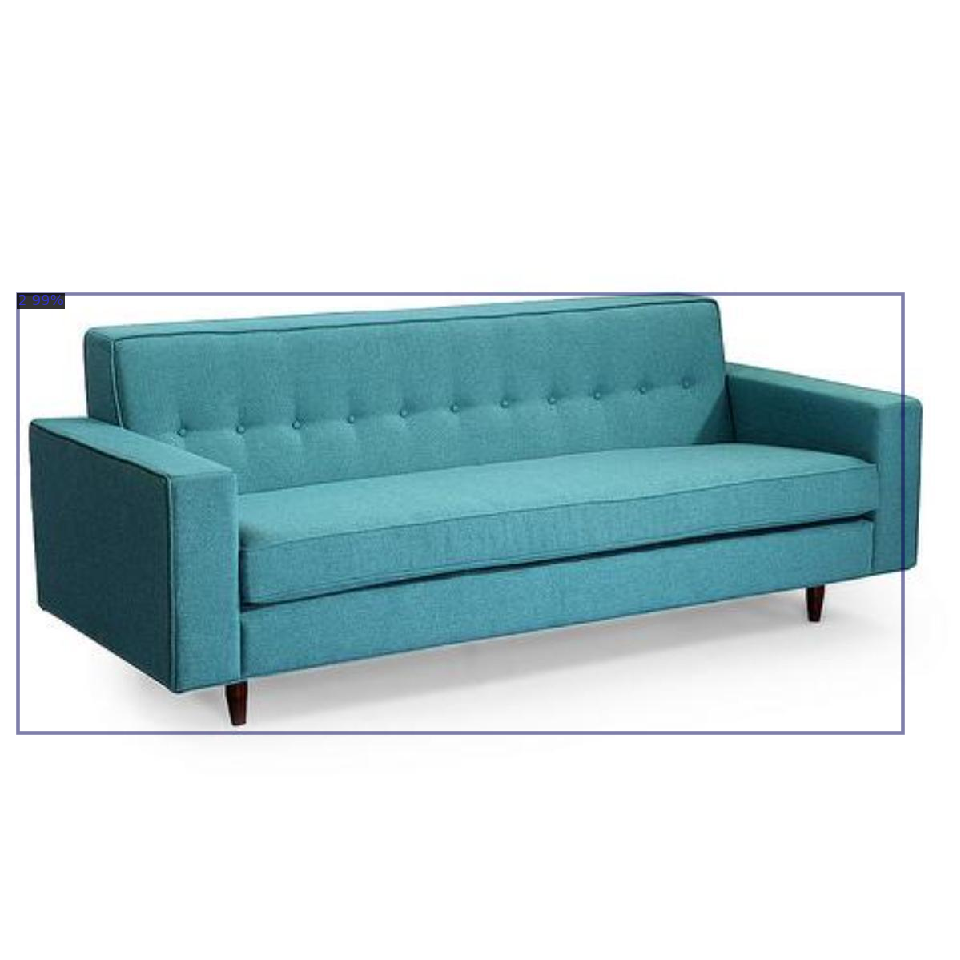

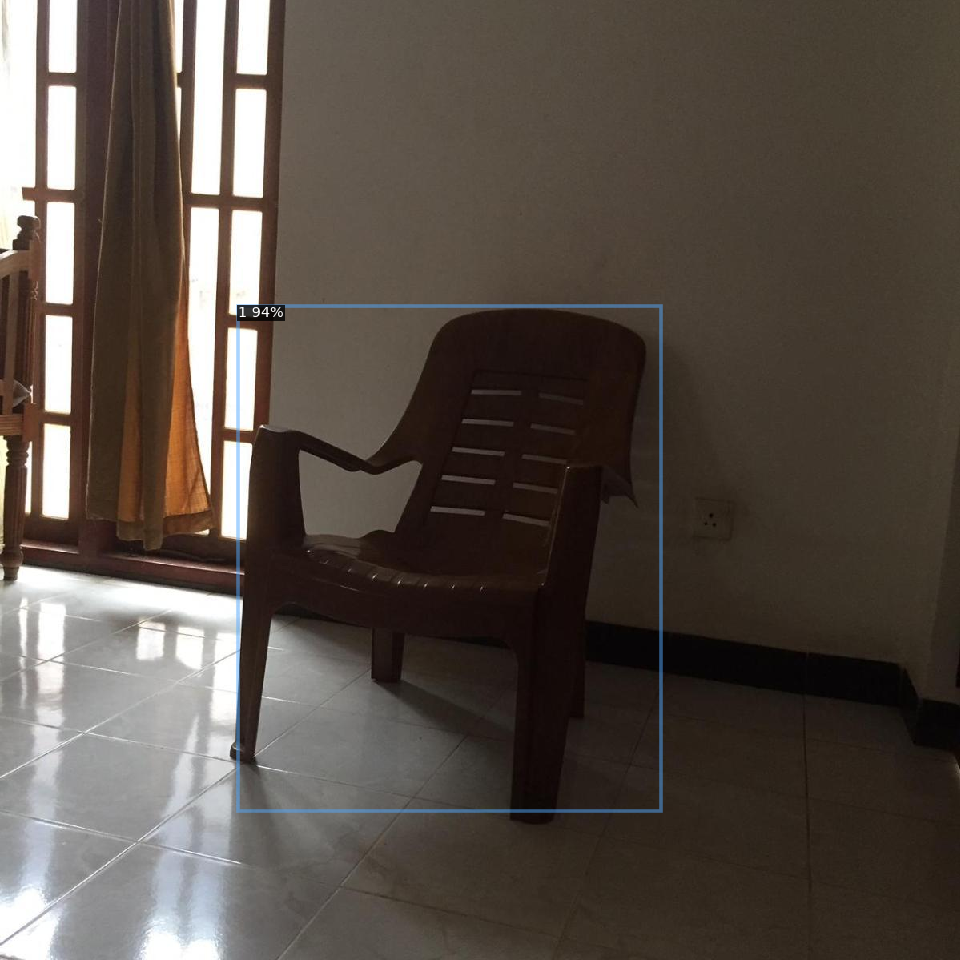

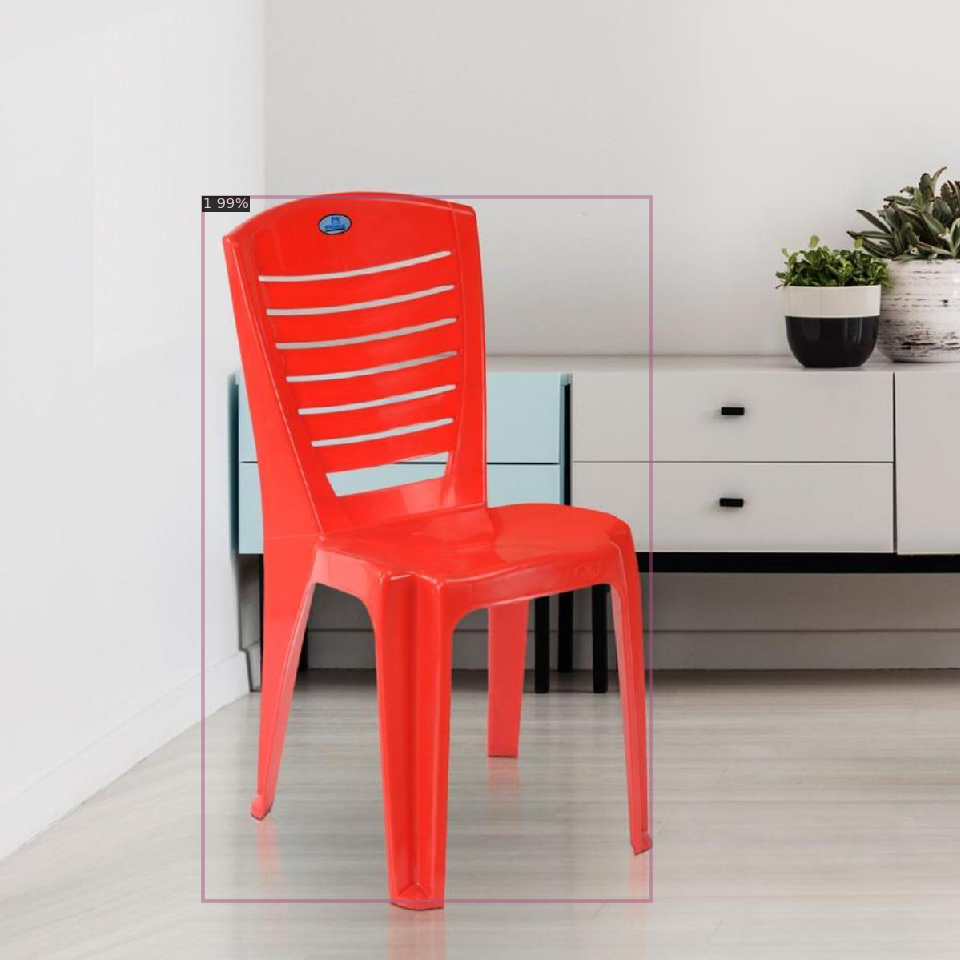

Image: /content/test/Chairs2--9-_jpg.rf.1071acc1f5d85f462874ee9fa1e1d920.jpg
Bounding Boxes: Boxes(tensor([[439.7643, 160.9074, 949.5784, 782.1887]]))
Scores: tensor([0.9645])
Predicted Classes: tensor([1])
---------------------------------------------------
Image: /content/test/Chairs--18-_jpg.rf.ea0390cdc8ae6ca3ed13e7905227205f.jpg
Bounding Boxes: Boxes(tensor([[ 270.6739,   96.2940,  903.8683, 1200.0000]]))
Scores: tensor([0.9836])
Predicted Classes: tensor([1])
---------------------------------------------------
Image: /content/test/Chairs2--3-_jpg.rf.23743311c2b2b7fa0a1a45f46cf7d0cd.jpg
Bounding Boxes: Boxes(tensor([[430.6737, 184.4022, 926.4003, 797.6934]]))
Scores: tensor([0.9427])
Predicted Classes: tensor([1])
---------------------------------------------------
Image: /content/test/Chairs1--12-_jpg.rf.86ece7cb0bbb8a485bcd7e43bee93e7e.jpg
Bounding Boxes: Boxes(tensor([[314.4341, 223.3788, 902.2877, 974.2665]]))
Scores: tensor([0.9589])
Predicted Classes: tensor([1])
-----------

In [17]:

from detectron2.utils.visualizer import ColorMode
import glob
# for imageName in glob.glob('/content/test/*jpg'):
#   im = cv2.imread(imageName)
#   outputs = predictor(im)
#   v = Visualizer(im[:, :, ::-1],
#                 metadata=test_metadata,
#                 scale=0.8
#                  )
#   out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
#   cv2_imshow(out.get_image()[:, :, ::-1])

displayed_images = 0
max_display = 10  # Maximum number of images to visualize

for imageName in glob.glob('/content/test/*jpg'):
    im = cv2.imread(imageName)
    outputs = predictor(im)

    if displayed_images < max_display:
        # Visualize the first 10 images
        v = Visualizer(im[:, :, ::-1],
                       metadata=test_metadata,
                       scale=0.8,
                       instance_mode=ColorMode.IMAGE  # Full-color mode
                      )
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        cv2_imshow(out.get_image()[:, :, ::-1])
        displayed_images += 1
    else:
        # For the rest of the images, print the details instead of visualizing
        instances = outputs["instances"].to("cpu")
        boxes = instances.pred_boxes if instances.has("pred_boxes") else None
        scores = instances.scores if instances.has("scores") else None
        classes = instances.pred_classes if instances.has("pred_classes") else None

        print(f"Image: {imageName}")
        print(f"Bounding Boxes: {boxes}")
        print(f"Scores: {scores}")
        print(f"Predicted Classes: {classes}")
        print("---------------------------------------------------")

In [18]:

from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_test", output_dir= "./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

WARNING [10/16 05:16:34 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/16 05:16:34 d2.data.datasets.coco]: Loaded 74 images in COCO format from /content/test/_annotations.coco.json
[10/16 05:16:34 d2.data.build]: Distribution of instances among all 4 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| furniture  | 0            |   Chair    | 50           |    Sofa    | 24           |
|   Table    | 0            |            |              |            |              |
|   total    | 74           |            |              |            |              |
[10/16 05:16:34 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[10/16 05:16:34 d2.data.common]: Serializing the dataset 

Overall Precision (AP): 86.28%
Overall Recall (AR): 89.6%
These are strong indicators that your model is performing well in terms of both object detection accuracy and object localization.